$$ ITI \space AI-Pro: \space Intake \space 45 $$
$$ Machine \space Learning \space 1 $$
$$ Lab \space no. \space 2 $$

# `01` Import Necessary Libraries

## `i` Default Libraries

In [53]:
from pathlib import Path
import pandas as pd
import numpy as np
import tarfile
import urllib.request

## `ii` Additional Libraries
Add imports for additional libraries you used throughout the notebook

In [25]:
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, RobustScaler, OrdinalEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, SGDRegressor


pd.set_option('display.max_columns', None)

import warnings
warnings.simplefilter("ignore")

----------------------------

# `02` Load Data

In [3]:
def load_housing_data():
    tarball_path = Path("datasets/housing.tgz")
    if not tarball_path.is_file():
        Path("datasets").mkdir(parents=True, exist_ok=True)
        url = "https://github.com/ageron/data/raw/main/housing.tgz"
        urllib.request.urlretrieve(url, tarball_path)
        with tarfile.open(tarball_path) as housing_tarball:
            housing_tarball.extractall(path="datasets")
    return pd.read_csv(Path("datasets/housing/housing.csv"))

housing = load_housing_data()

## `#` About Data:
- The data pertains to the houses found in a given California district and some summary stats about them based on the 1990 census data.<br>
- Be warned the data aren't cleaned so there are some preprocessing steps required! <br>
---
- The columns are as follows, their names are pretty self explanitory:
  - 1. `longitude`: A measure of how far west a house is; a higher value is farther west
  - 2. `latitude`: A measure of how far north a house is; a higher value is farther north
  - 3. `housingMedianAge`: Median age of a house within a block; a lower number is a newer building
  - 4. `totalRooms`: Total number of rooms within a block
  - 5. `totalBedrooms`: Total number of bedrooms within a block
  - 6. `population`: Total number of people residing within a block
  - 7. `households`: Total number of households, a group of people residing within a home unit, for a block
  - 8. `medianIncome`: Median income for households within a block of houses (measured in tens of thousands of US Dollars)
  - 9. `medianHouseValue`: Median house value for households within a block (measured in US Dollars)
  - 10. `oceanProximity`: Location of the house w.r.t ocean/sea

---

## `#` Questions:
### <u>General Questions :</u>

- 1- Are there any missing values in our dataset?
- 2- Are there any duplicated values in our dataset?
- 3- What is the numerical description of our dataset?
- 4- What is the categorical description of our dataset?
- 5- What is the number of unique values in each column in our dataset?
- 6- Initial Data Assessment.
- 7- what is the distribution of each numerical columns?
- 8- what is the count of each categorical column?
- 9- Is there outliers in our data?

### <u>Demographic and Personal Questions :</u>
    
- 1- What are the geographical insights lead to?
- 2- What is the relation between each column and the target?
- 3- Is there a corelation between columns?



---

## `#` Create Test Set

Before exploring the data, let's split the data into training and test sets. You shouldn't touch the test set from this point furthur except for final model evaluation.

Use:
- `random_state` $= 1234$
- `test_size` $= 0.2$

Hint: You can use `sklearn.model_selection.train_test_split` function

In [4]:
housing_train, housing_test = train_test_split(housing, test_size=0.2, random_state=1234)

----------------

# `03` Exploratory Data Analysis (EDA)

## `i` Simple Analysis

Preview data, perform statistical data analysis and explore as much as needed to better understand the data set we're dealing with.

`Note:` Feel free to look up EDA approaches online for inspiration (however you **must understand** everything and not copy paste).

In [35]:
housing.head().style.background_gradient(cmap='Oranges')

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.230000,37.880000,41.000000,880.000000,129.000000,322.000000,126.000000,8.325200,452600.000000,NEAR BAY
1,-122.220000,37.860000,21.000000,7099.000000,1106.000000,2401.000000,1138.000000,8.301400,358500.000000,NEAR BAY
2,-122.240000,37.850000,52.000000,1467.000000,190.000000,496.000000,177.000000,7.257400,352100.000000,NEAR BAY
3,-122.250000,37.850000,52.000000,1274.000000,235.000000,558.000000,219.000000,5.643100,341300.000000,NEAR BAY
4,-122.250000,37.850000,52.000000,1627.000000,280.000000,565.000000,259.000000,3.846200,342200.000000,NEAR BAY


In [16]:
housing.shape

(20640, 10)

In [17]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [20]:
#Check Missing
housing.isnull().sum()

,0
longitude,0
latitude,0
housing_median_age,0
total_rooms,0
total_bedrooms,207
population,0
households,0
median_income,0
median_house_value,0
ocean_proximity,0


In [21]:
housing.isna().sum()/housing.shape[0]*100

,0
longitude,0.000000
latitude,0.000000
housing_median_age,0.000000
total_rooms,0.000000
total_bedrooms,1.002907
population,0.000000
households,0.000000
median_income,0.000000
median_house_value,0.000000
ocean_proximity,0.000000


- There is too few missing in `'total_bedrooms'` column.

In [22]:
#Check duplicates
housing.duplicated().sum()

0

In [23]:
housing.nunique()

,0
longitude,844
latitude,862
housing_median_age,52
total_rooms,5926
total_bedrooms,1923
population,3888
households,1815
median_income,12928
median_house_value,3842
ocean_proximity,5


---

### Numerical Columns:

In [24]:
obj_cols = housing.select_dtypes(include='object').columns
num_cols = housing.select_dtypes(exclude='object').columns[:-1]
print(f'Object columns : {obj_cols}', end='\n\n')
print(f'Numberical columns : {num_cols}')

Object columns : Index(['ocean_proximity'], dtype='object')

Numberical columns : Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income'],
      dtype='object')


In [27]:
housing.describe(include="object").T

,count,unique,top,freq
ocean_proximity,20640,5,<1H OCEAN,9136


### Categorical Columns:


In [36]:
housing.describe(exclude = "object").T.style.background_gradient(cmap='Oranges')

,count,mean,std,min,25%,50%,75%,max
longitude,20640.000000,-119.569704,2.003532,-124.350000,-121.800000,-118.490000,-118.010000,-114.310000
latitude,20640.000000,35.631861,2.135952,32.540000,33.930000,34.260000,37.710000,41.950000
housing_median_age,20640.000000,28.639486,12.585558,1.000000,18.000000,29.000000,37.000000,52.000000
total_rooms,20640.000000,2635.763081,2181.615252,2.000000,1447.750000,2127.000000,3148.000000,39320.000000
total_bedrooms,20433.000000,537.870553,421.385070,1.000000,296.000000,435.000000,647.000000,6445.000000
population,20640.000000,1425.476744,1132.462122,3.000000,787.000000,1166.000000,1725.000000,35682.000000
households,20640.000000,499.539680,382.329753,1.000000,280.000000,409.000000,605.000000,6082.000000
median_income,20640.000000,3.870671,1.899822,0.499900,2.563400,3.534800,4.743250,15.000100
median_house_value,20640.000000,206855.816909,115395.615874,14999.000000,119600.000000,179700.000000,264725.000000,500001.000000


In [31]:
housing[obj_cols].value_counts()

,count
ocean_proximity,
<1H OCEAN,9136
INLAND,6551
NEAR OCEAN,2658
NEAR BAY,2290
ISLAND,5


---

 ### <u>Univariate Data Visualizations :</u>

- Numerical columns:

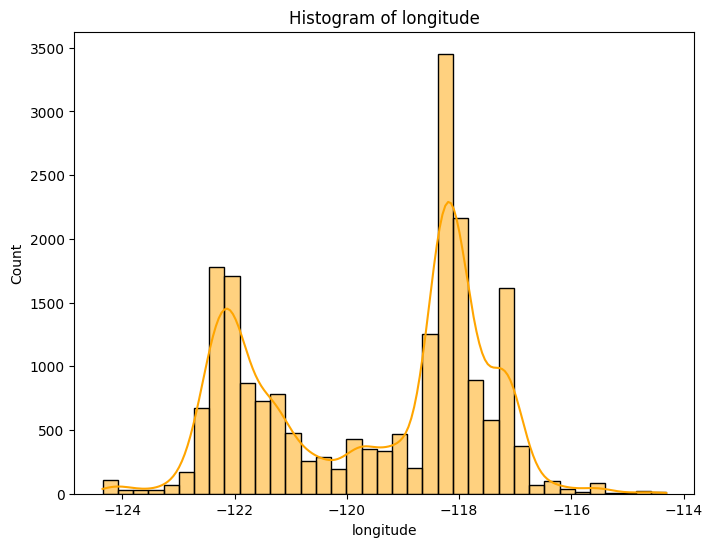

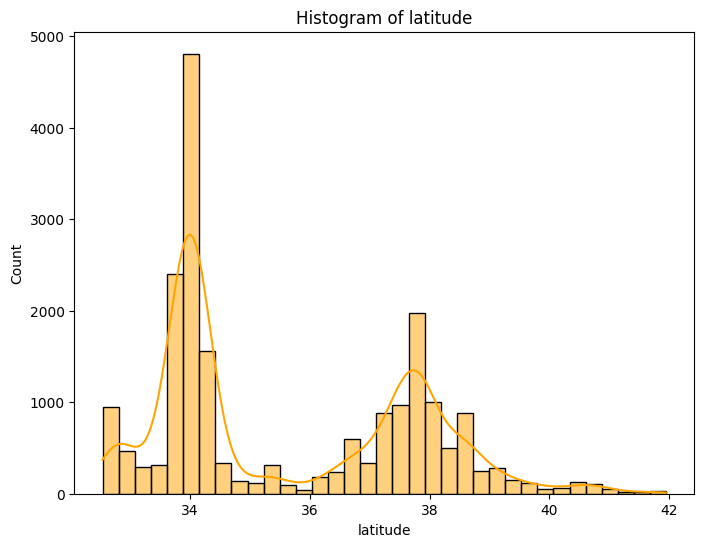

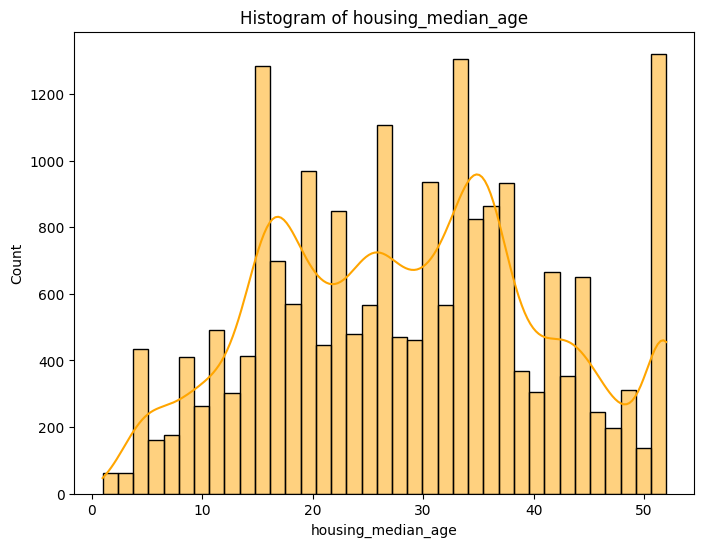

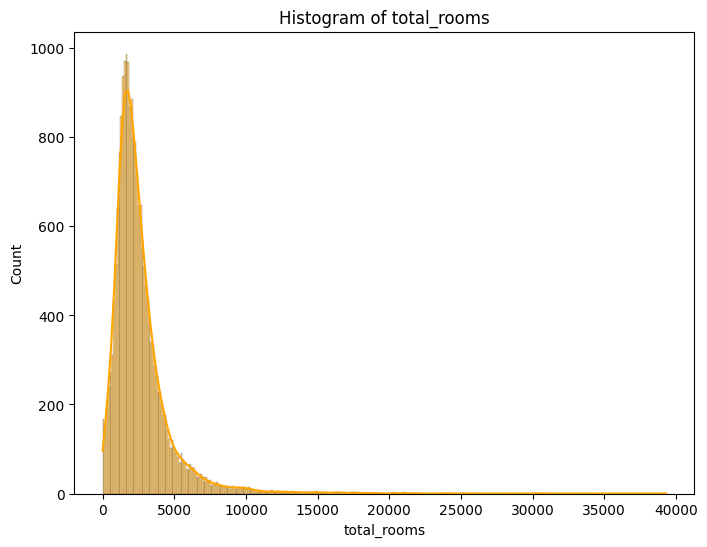

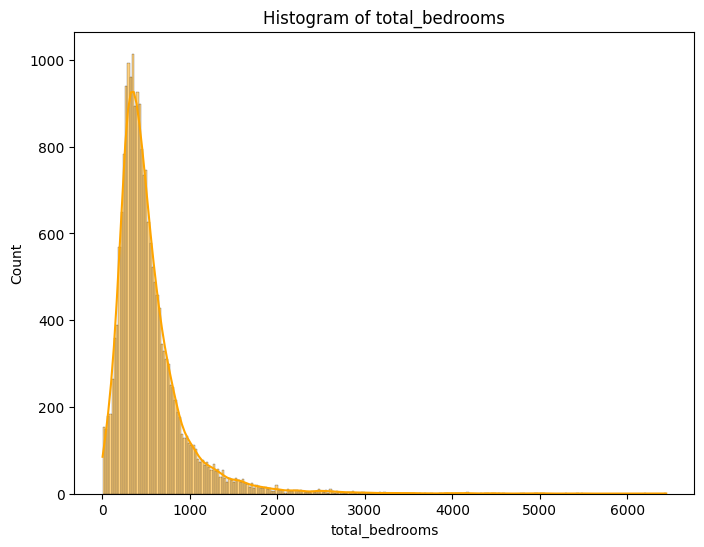

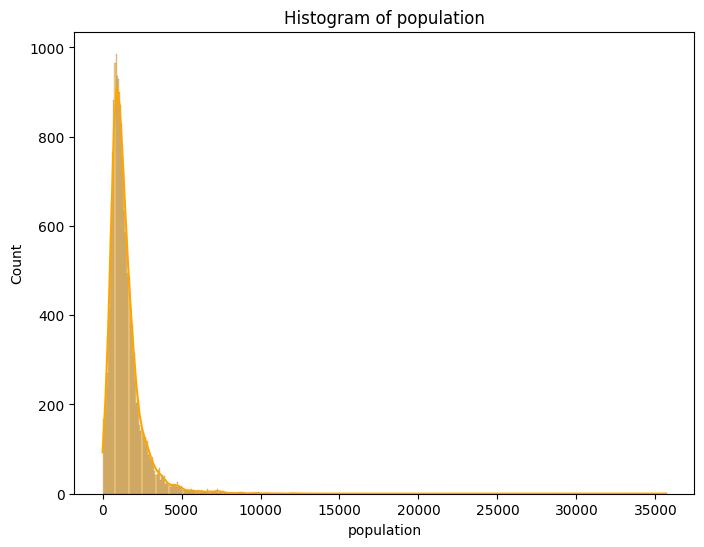

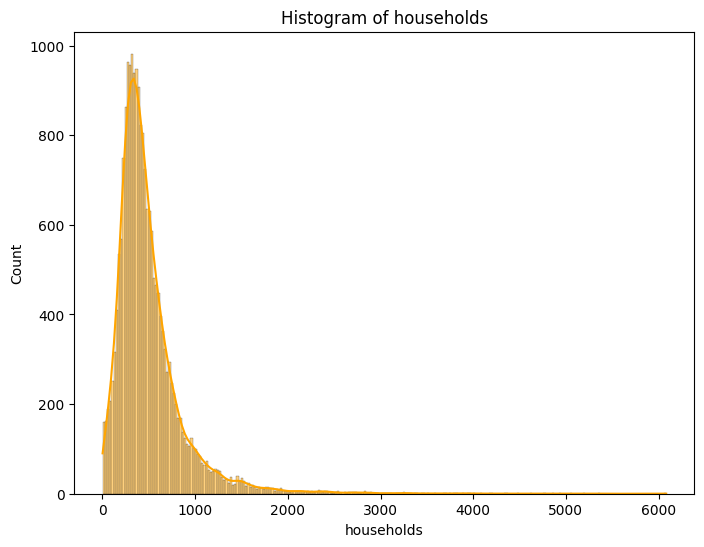

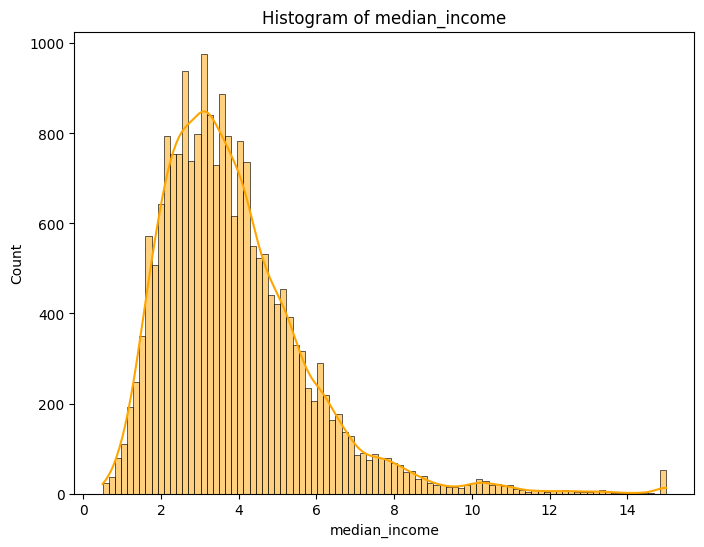

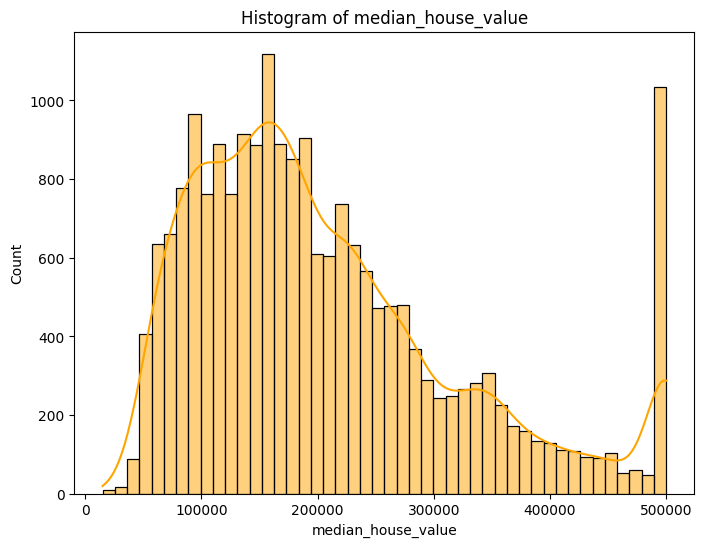

In [34]:
numeric_cols = housing.select_dtypes(include = ["float64"]).columns

for col in numeric_cols :
    plt.figure(figsize=(8,6))
    sns.histplot(data = housing , x= col , kde=True , color = "orange")
    plt.title(f"Histogram of {col}")
    plt.show()

- Categorical columns:

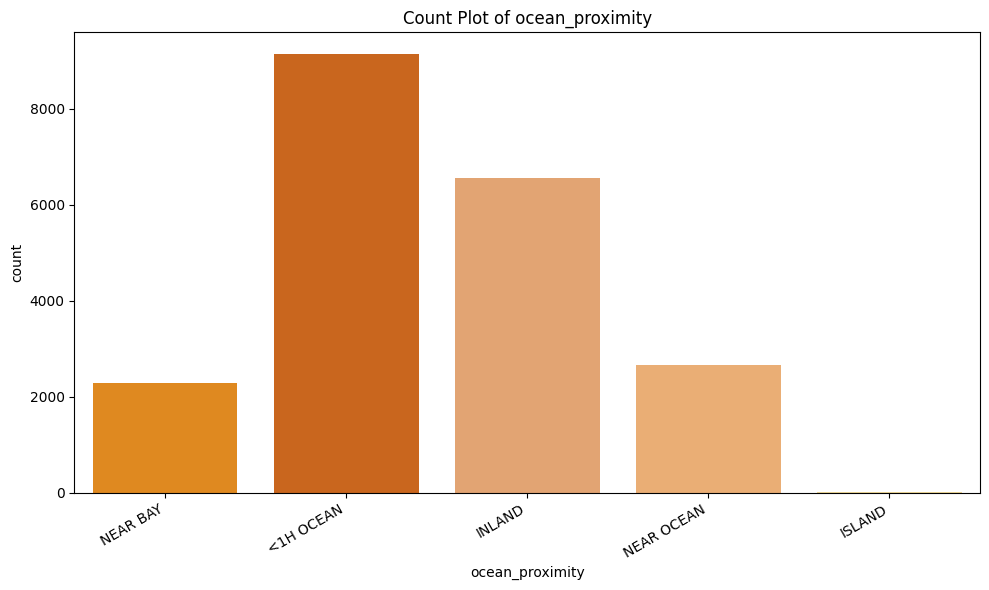

In [39]:
colors = ['#FF8C00', '#E66101', '#F4A261', '#FDAE61', '#FEE08B']

plt.figure(figsize=(10, 6))
sns.countplot(data=housing, x='ocean_proximity', palette=colors)
plt.title("Count Plot of ocean_proximity")
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()

---

### <u>Check outliers:</u>

In [51]:
numeric_cols = housing.select_dtypes(include=["float64"])

Q1 = numeric_cols.quantile(0.25)
Q3 = numeric_cols.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (numeric_cols < lower_bound) | (numeric_cols > upper_bound)

outlier_counts = outliers_mask.sum(axis=0)

total_rows = numeric_cols.shape[0]
outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": outlier_counts,
    "Outlier Percentage": outlier_percentage
})

outliers_summary.style.background_gradient(cmap='Oranges')


,Number of Outliers,Outlier Percentage
longitude,0,0.000000
latitude,0,0.000000
housing_median_age,0,0.000000
total_rooms,1287,6.235465
total_bedrooms,1271,6.157946
population,1196,5.794574
households,1220,5.910853
median_income,681,3.299419
median_house_value,1071,5.188953


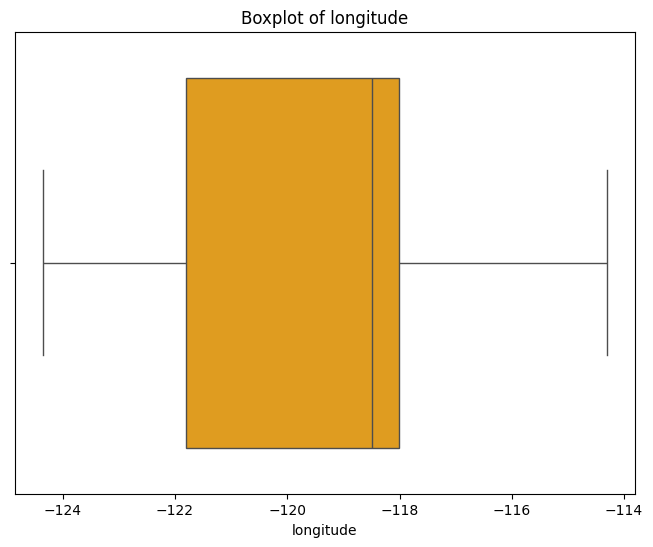

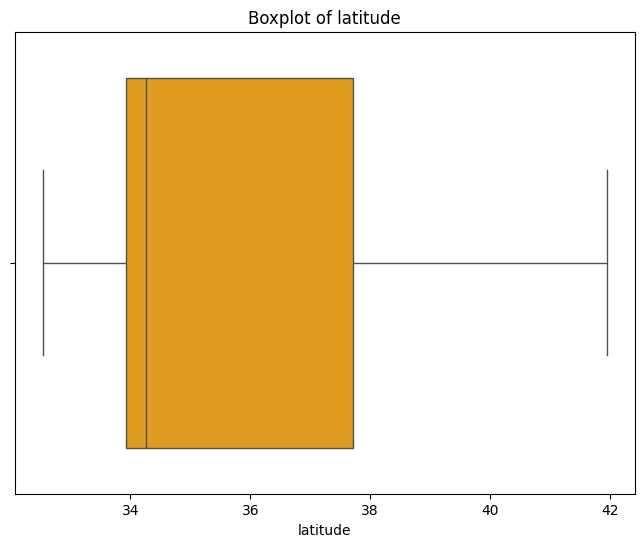

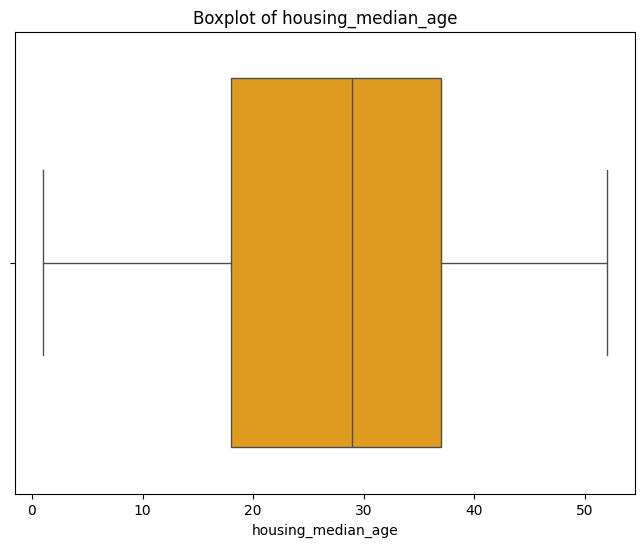

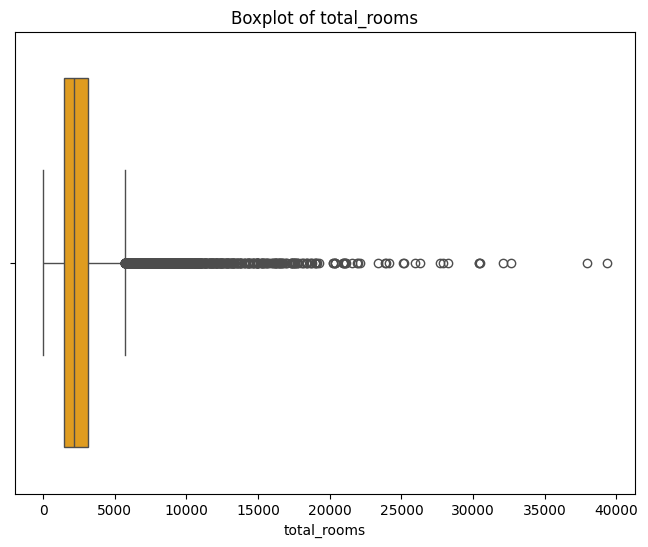

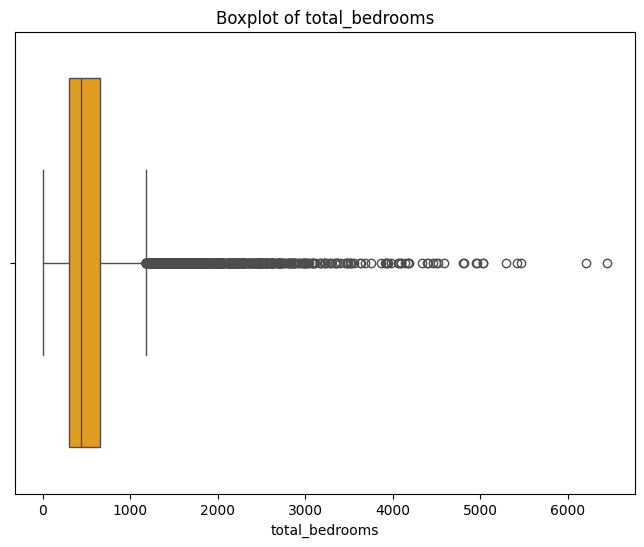

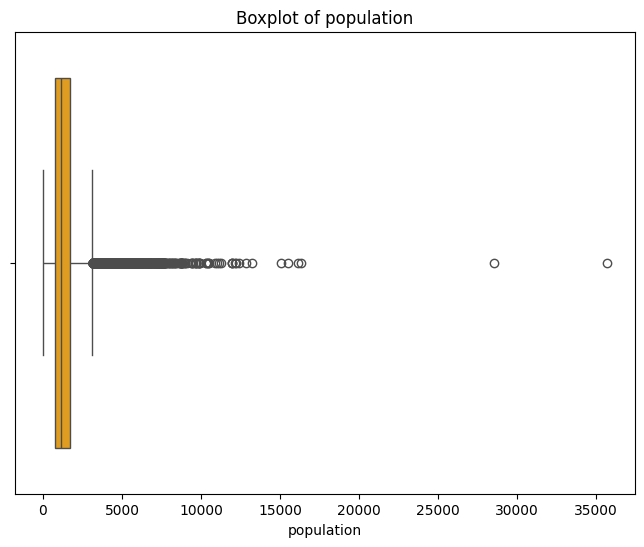

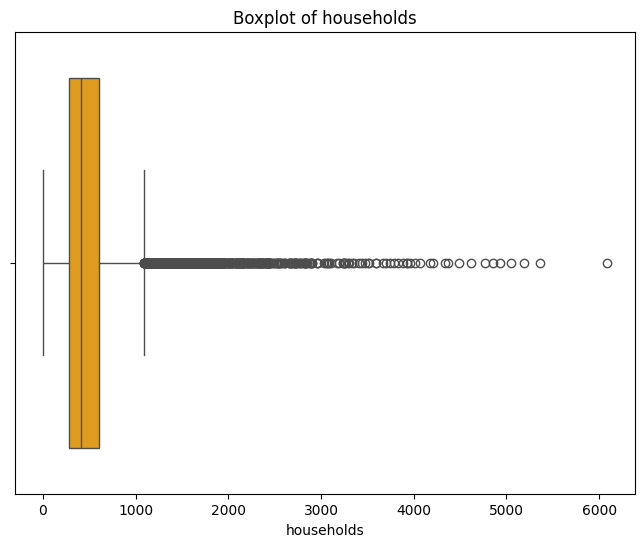

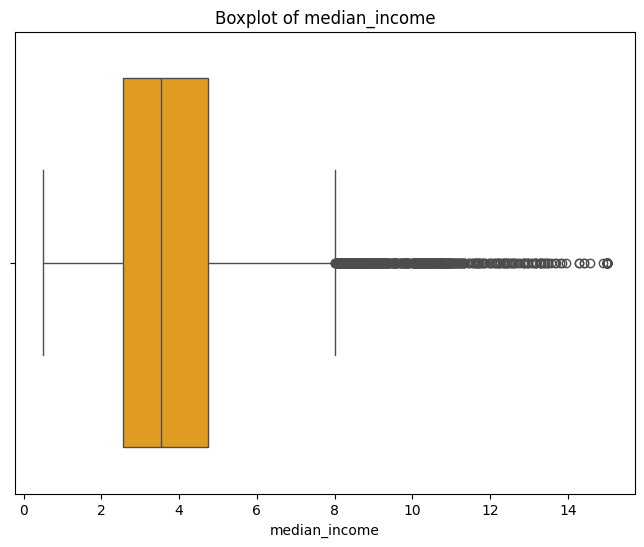

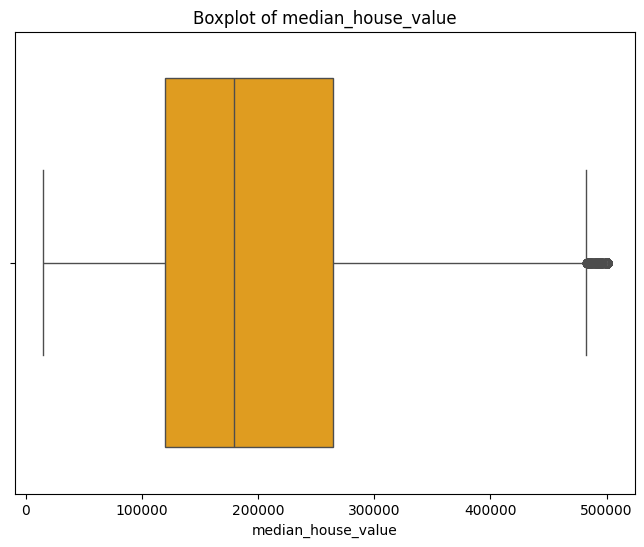

In [49]:
numeric_cols = housing.select_dtypes(include=["float64"]).columns

for col in numeric_cols:
    plt.figure(figsize=(8, 6))

    sns.boxplot(x=housing[col], orient="h", color="orange")

    plt.xlabel(col)
    plt.title(f"Boxplot of {col}")

    plt.show()

---

In [15]:
report = ProfileReport(housing, title="Housing Data Report", explorative=True)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

`#`## Insights:
- <u>Dataset Overview:</u><br>
  - Total Observations: 20,640
  - Total Variables: 10
  - Numeric Features: 9
  - Categorical Features: 1 (ocean_proximity)

- <u>Missing Data:</u><br>
  - Total Missing Cells: 207 (0.1% of the data)
  - Feature with Missing Values: total_bedrooms (207 missing entries, ~1%)
  - Duplicate Rows: None detected.

- <u>Outliers:</u>
 - total_rooms: Maximum value (39,320) significantly higher than the mean (2,635). Investigate for outliers.
 - population: Maximum of 35,682 suggests highly dense areas.
 - median_house_value: Capped at 500,001, which might affect regression models due to truncation bias.


## `ii` Visual Analysis

Plot graphs and relations in order to gain more insights about the data set, identify patterns, and make assumptions.

`Note:` Feel free to look up visual EDA approaches online for inspiration (however you **must understand** everything and not copy paste).

### <u>Bivariate Data Visualizations :</u>

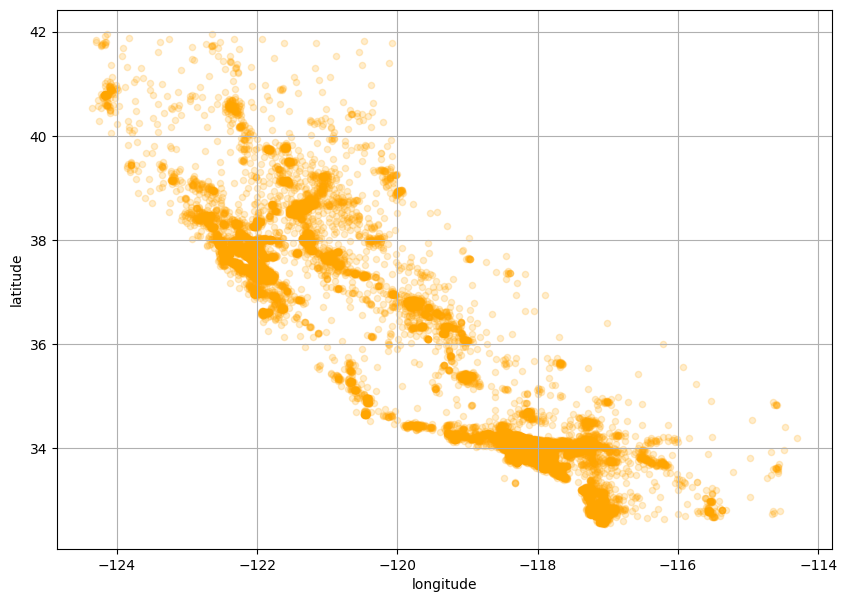

In [64]:
housing.plot(kind="scatter", x = "longitude", y="latitude",alpha=0.2, grid=True, color = 'orange', figsize=(10,7))
plt.show()

<Axes: xlabel='median_house_value', ylabel='housing_median_age'>

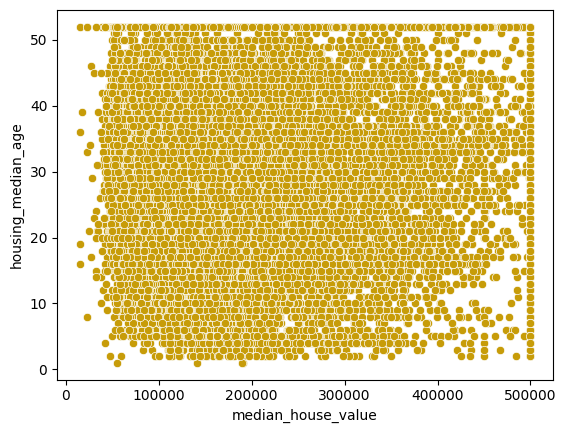

In [63]:
# scatterplot for the housing_median_age with median_house_value to check the outliers with respect to the target (median_house_value)
sns.scatterplot(x='median_house_value',y="housing_median_age",data=housing,color='#c79c09')

<Axes: xlabel='total_bedrooms', ylabel='median_house_value'>

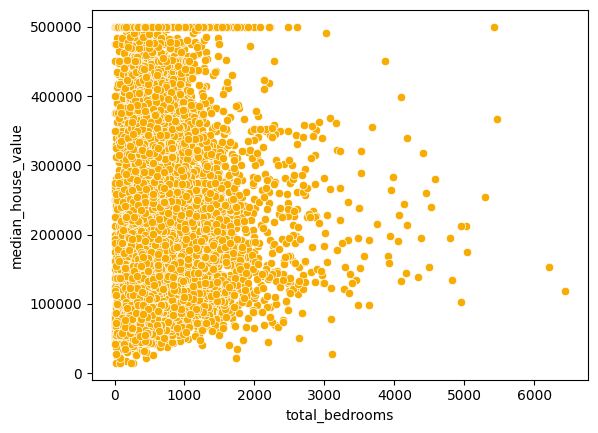

In [62]:
# scatterplot for the total_bedrooms with median_house_value to check the outliers with respect to the target (median_house_value)
sns.scatterplot(y='median_house_value',x="total_bedrooms",data=housing,color='#f8ab01')

<Axes: xlabel='households', ylabel='median_house_value'>

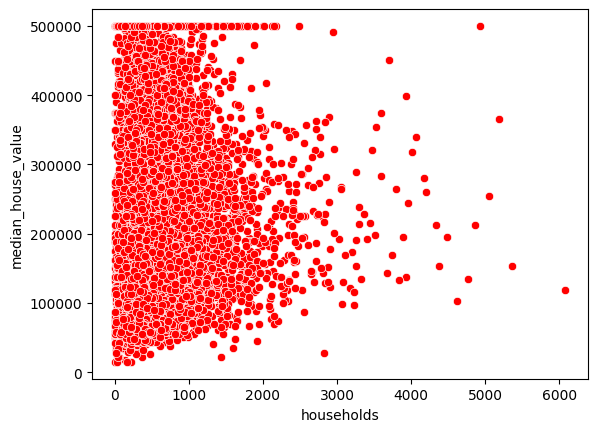

In [61]:
# scatterplot for the households with median_house_value to check the outliers with respect to the target (median_house_value)
sns.scatterplot(y='median_house_value',x="households",data=housing,color='red')

<Axes: xlabel='population', ylabel='median_house_value'>

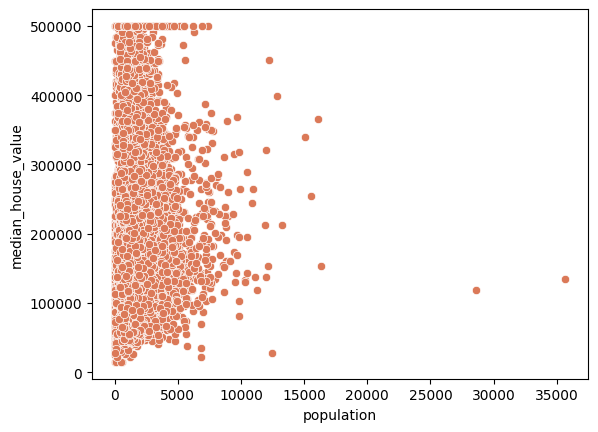

In [56]:
# scatterplot for the housing_median_age with population to check the outliers with respect to the target (median_house_value)
sns.scatterplot(y='median_house_value',x="population",data=housing,color='#DB7958')

<Axes: xlabel='median_income', ylabel='median_house_value'>

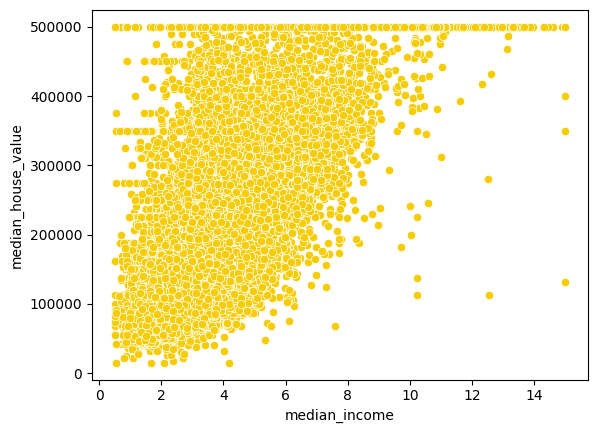

In [59]:
# scatterplot for the median_income with median_house_value to check the outliers with respect to the target (median_house_value)
sns.scatterplot(y='median_house_value',x="median_income",data=housing,color='#f6cd04')

### <u>Multivariate Data Visualizations :</u>

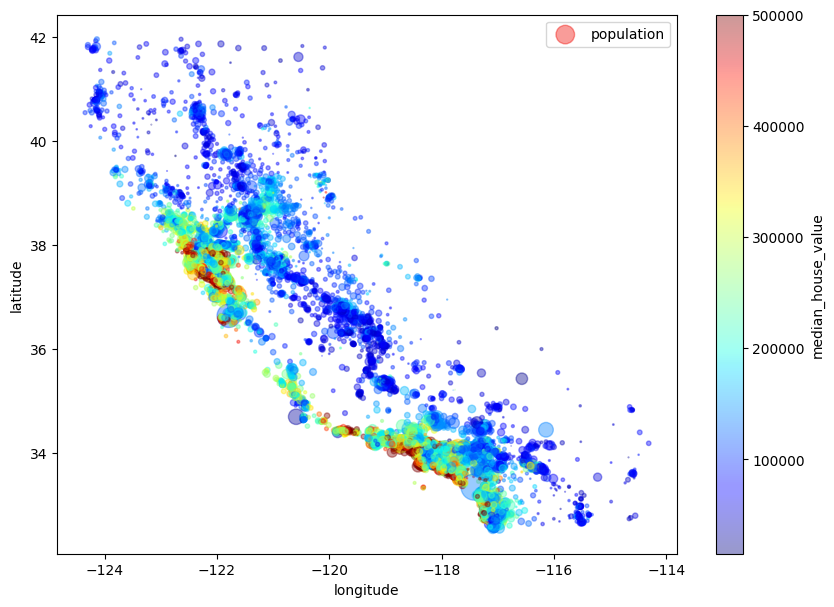

In [58]:
housing.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,
             s=housing["population"]/100, label="population", figsize=(10,7),
             c="median_house_value", cmap=plt.get_cmap("jet"), colorbar=True,
             sharex=False)
plt.legend()

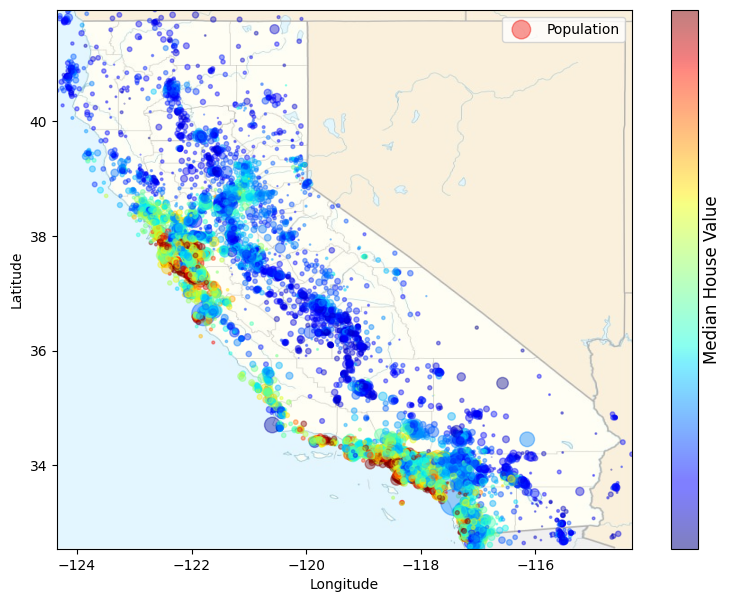

In [56]:
california_img=mpimg.imread('/content/map.jpg')
ax = housing.plot(kind="scatter", x="longitude", y="latitude", figsize=(10,7),
                  s=housing['population']/100, label="Population",
                  c="median_house_value", cmap ='jet',
                  colorbar=False, alpha=0.4)

plt.imshow(california_img, extent=[-124.35,-114.31, 32.54, 41.95], alpha=0.5,
           cmap='jet')


plt.ylabel("Latitude")
plt.xlabel("Longitude")

prices = housing["median_house_value"]
tick_values = np.linspace(prices.min(), prices.max(), 11)
cbar = plt.colorbar(ticks=tick_values/prices.max())
cbar.ax.set_yticklabels(["$%dk"%(round(v/1000)) for v in tick_values])
cbar.set_label('Median House Value', fontsize=12)

plt.legend()
plt.show();


In [ ]:
numerical_cols = ['longitude', 'latitude', 'housing_median_age', 'total_rooms',
                  'total_bedrooms', 'population', 'households', 'median_income',
                  'median_house_value']
housing_subset = housing[numerical_cols]


sns.pairplot(housing_subset, diag_kind='kde')
plt.show()

<Axes: >

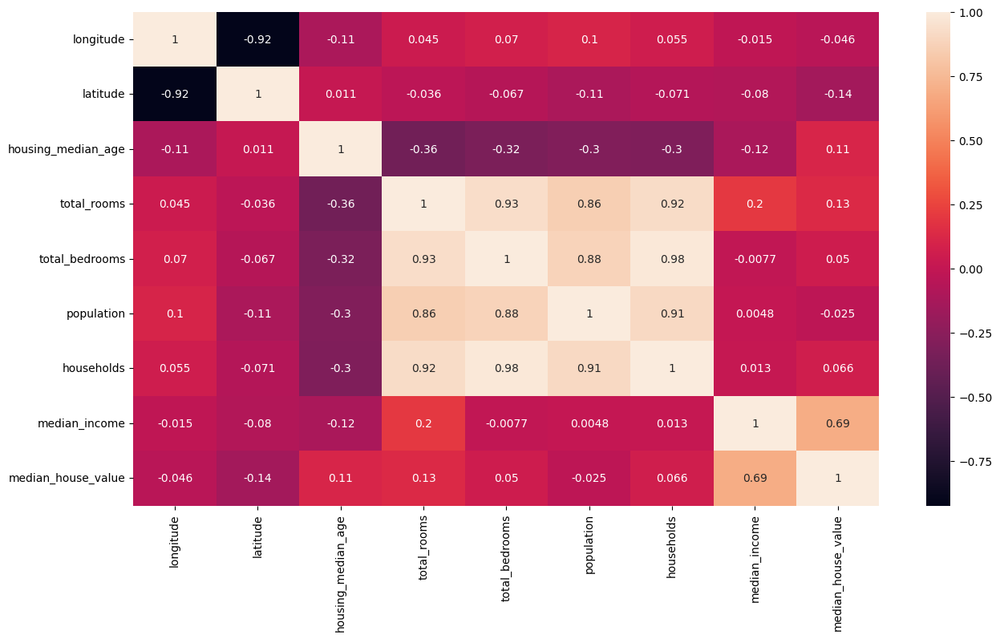

In [64]:
plt.figure(figsize=(15, 8))
sns.heatmap(housing[numerical_cols].corr(), annot=True)

### High Correlation Features:

Several features like:
<br> `total_rooms`, `population`, `households`, and `median_income` are likely correlated with median_house_value (target variable).

----------------

# `04` Data Preparation

Perform data cleaning, feature engineering, scaling, etc. as needed to make sure it's ready for the model.

Hint: It could be helpful to check `sklearn.preprocessing` module.

### <u>Feature Engineering:</u>

In [5]:
# no of rooms per house
housing['rooms_per_house'] = housing['total_rooms']/housing['households']
#number of bedrooms
housing['bedroom_ratio'] = housing['total_bedrooms']/housing['total_rooms']
# population per house
housing['people_per_house'] = housing['population']/housing['households']

### <u>Data Cleaning:</u>

- Impute missing values:

In [6]:
numerical_cols = housing_train.select_dtypes(include=["float64", "int64"]).columns
imputer = SimpleImputer(strategy="median")
housing_train[numerical_cols] = imputer.fit_transform(housing_train[numerical_cols])

### <u>Feature Scaling:</u>

In [7]:
ro_scaler = RobustScaler()
housing_train[numerical_cols] = ro_scaler.fit_transform(housing_train[numerical_cols])

### <u>Encoding:</u>

In [8]:
# covert the column ocean_proximity to numeric by labelencoder
l = OrdinalEncoder()
housing_train['ocean_proximity'] = l.fit_transform(housing_train[['ocean_proximity']])

## `#` Prepare Test Set

Apply the data transformations you used on the training set to the test set.

**Important Note:** DO NOT use `fit` on the test set.

In [ ]:
housing_test[numerical_cols] = imputer.transform(housing_test[numerical_cols])

In [11]:
housing_test[numerical_cols] = ro_scaler.transform(housing_test[numerical_cols])

In [12]:
housing_test['ocean_proximity'] = l.transform(housing_test[['ocean_proximity']])

----------------------------

# `05` Normal Equation

Using `sklearn` implementation of the linear regression closed-form solution, i.e. normal equation, to model the data.

Hint: Look for `sklearn.linear_model.LinearRegression` class.

## `i` Model Training

Initializing the model, fitting it to the training data, and get a fitted model.

In [14]:
X_housing_train = housing_train.drop('median_house_value', axis=1)
Y_housing_train = housing_train['median_house_value']

In [17]:
reg = LinearRegression()
reg.fit(X_housing_train, Y_housing_train)

LinearRegression()

## `ii` Model Evaluation

Evaluate model performance using several metrics, e.g. **RMSE**, **MAE**, $R^2$. etc.

In [18]:
y_pred_train = reg.predict(X_housing_train)
mse_train = mean_squared_error(Y_housing_train, y_pred_train)
rmse_train = mse_train**0.5
mae_train = mean_absolute_error(Y_housing_train, y_pred_train)
r2_train = r2_score(Y_housing_train, y_pred_train)

print("Training Set Evaluation:")
print(f"RMSE: {rmse_train}")
print(f"MAE: {mae_train}")
print(f"R^2: {r2_train}")

X_housing_test = housing_test.drop('median_house_value', axis=1)
Y_housing_test = housing_test['median_house_value']

y_pred_test = reg.predict(X_housing_test)
mse_test = mean_squared_error(Y_housing_test, y_pred_test)
rmse_test = mse_test**0.5
mae_test = mean_absolute_error(Y_housing_test, y_pred_test)
r2_test = r2_score(Y_housing_test, y_pred_test)

print("\nTest Set Evaluation:")
print(f"RMSE: {rmse_test}")
print(f"MAE: {mae_test}")
print(f"R^2: {r2_test}")


Training Set Evaluation:
RMSE: 0.47603800409095726
MAE: 0.3492607056870007
R^2: 0.6396467701521298

Test Set Evaluation:
RMSE: 0.48560796561815234
MAE: 0.3515312393693125
R^2: 0.6174231110508329


In [20]:
test_output = pd.DataFrame({'y_test':Y_housing_test,'Y_pred':y_pred_test})

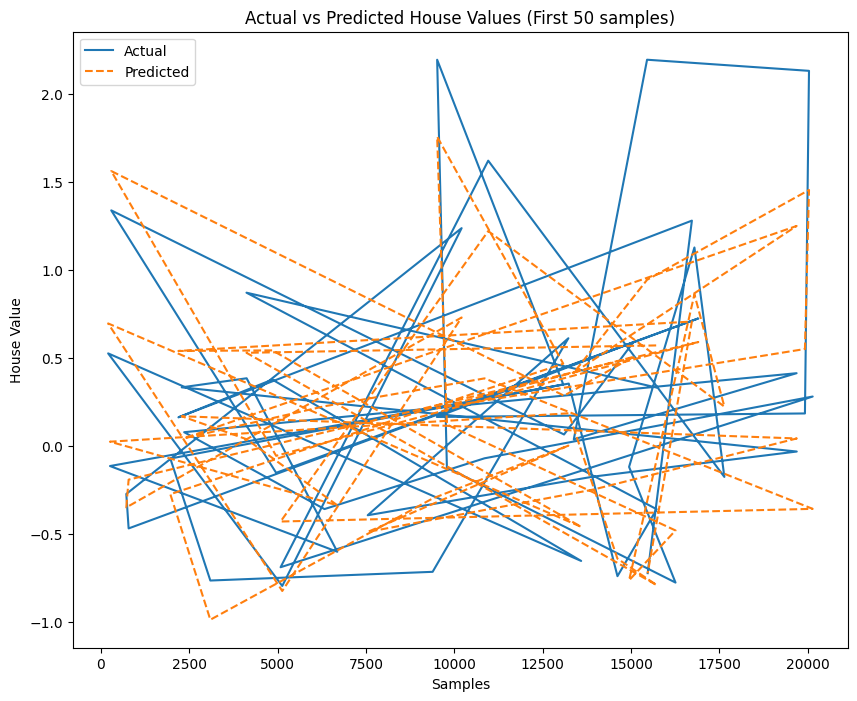

In [23]:
plt.figure(figsize=(10, 8))
plt.plot(test_output[:50]['y_test'], label='Actual')
plt.plot(test_output[:50]['Y_pred'], label='Predicted', linestyle='--')
plt.xlabel('Samples')
plt.ylabel('House Value')
plt.title('Actual vs Predicted House Values (First 50 samples)')
plt.legend()
plt.show()

----------------------

# `06` Linear Regression with Gradient Descent

Using `sklearn` implementation of linear regression to model the data.

Hint: Look for `sklearn.linear_model.SGDRegressor` class.

## `i` Baseline Model Training

Initializing the model with initial parameters, fitting it to the training data, and get a baseline model.

Use:
- Non-regularized model.
- Constant `learning_rate`

In [29]:
sgd_reg = SGDRegressor(penalty=None, eta0=0.01, max_iter=1000, tol=1e-3, random_state=42)

sgd_reg.fit(X_housing_train, Y_housing_train)

y_pred_train_sgd = sgd_reg.predict(X_housing_train)

## `ii` Model Evaluation

Evaluate the baseline model performance using several metrics, e.g. **RMSE**, **MAE**, $R^2$. etc.

In [30]:
mse_train_sgd = mean_squared_error(Y_housing_train, y_pred_train_sgd)
rmse_train_sgd = mse_train_sgd**0.5
mae_train_sgd = mean_absolute_error(Y_housing_train, y_pred_train_sgd)
r2_train_sgd = r2_score(Y_housing_train, y_pred_train_sgd)

print("Baseline SGDRegressor Training Set Evaluation:")
print(f"RMSE: {rmse_train_sgd}")
print(f"MAE: {mae_train_sgd}")
print(f"R^2: {r2_train_sgd}")

y_pred_test_sgd = sgd_reg.predict(X_housing_test)

mse_test_sgd = mean_squared_error(Y_housing_test, y_pred_test_sgd)
rmse_test_sgd = mse_test_sgd**0.5
mae_test_sgd = mean_absolute_error(Y_housing_test, y_pred_test_sgd)
r2_test_sgd = r2_score(Y_housing_test, y_pred_test_sgd)


print("\nBaseline SGDRegressor Test Set Evaluation:")
print(f"RMSE: {rmse_test_sgd}")
print(f"MAE: {mae_test_sgd}")
print(f"R^2: {r2_test_sgd}")

Baseline SGDRegressor Training Set Evaluation:
RMSE: 0.4775224992300518
MAE: 0.3489734639803091
R^2: 0.6373957872212158

Baseline SGDRegressor Test Set Evaluation:
RMSE: 0.48818799295113785
MAE: 0.35205717615473536
R^2: 0.6133470619972912


In [27]:
test_output = pd.DataFrame({'y_test':Y_housing_test,'Y_pred':y_pred_test})

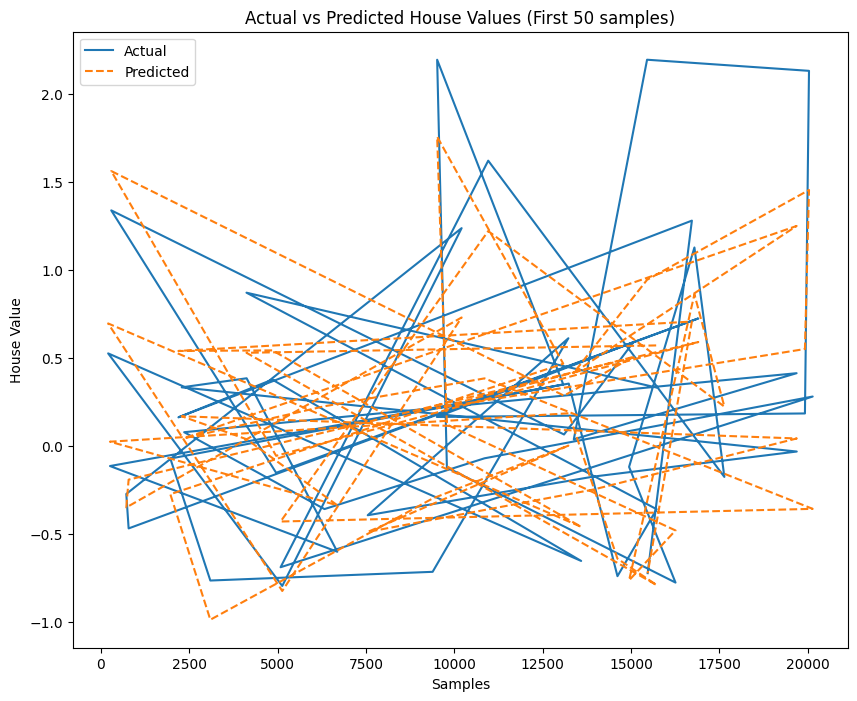

In [28]:
plt.figure(figsize=(10, 8))
plt.plot(test_output[:50]['y_test'], label='Actual')
plt.plot(test_output[:50]['Y_pred'], label='Predicted', linestyle='--')
plt.xlabel('Samples')
plt.ylabel('House Value')
plt.title('Actual vs Predicted House Values (First 50 samples)')
plt.legend()
plt.show()

## `iii` Tune `learning_rate`

Try different `learning_rate` values and evaluate. What is the optimal learning rate?

Hint: You might want to use `sklearn.model_selection.RandomizedSearchCV` or `sklearn.model_selection.GridSearchCV` classes.

In [48]:
sgd_reg = SGDRegressor(penalty=None, eta0=0.05, max_iter=100000, tol=1e-3, random_state=42)

sgd_reg.fit(X_housing_train, Y_housing_train)

y_pred_train_sgd = sgd_reg.predict(X_housing_train)

In [49]:
mse_train_sgd = mean_squared_error(Y_housing_train, y_pred_train_sgd)
rmse_train_sgd = mse_train_sgd**0.5
mae_train_sgd = mean_absolute_error(Y_housing_train, y_pred_train_sgd)
r2_train_sgd = r2_score(Y_housing_train, y_pred_train_sgd)

print("Baseline SGDRegressor Training Set Evaluation:")
print(f"RMSE: {rmse_train_sgd}")
print(f"MAE: {mae_train_sgd}")
print(f"R^2: {r2_train_sgd}")

y_pred_test_sgd = sgd_reg.predict(X_housing_test)

mse_test_sgd = mean_squared_error(Y_housing_test, y_pred_test_sgd)
rmse_test_sgd = mse_test_sgd**0.5
mae_test_sgd = mean_absolute_error(Y_housing_test, y_pred_test_sgd)
r2_test_sgd = r2_score(Y_housing_test, y_pred_test_sgd)


print("\nBaseline SGDRegressor Test Set Evaluation:")
print(f"RMSE: {rmse_test_sgd}")
print(f"MAE: {mae_test_sgd}")
print(f"R^2: {r2_test_sgd}")

Baseline SGDRegressor Training Set Evaluation:
RMSE: 0.4785762632094569
MAE: 0.35237172709202075
R^2: 0.6357936811253833

Baseline SGDRegressor Test Set Evaluation:
RMSE: 0.4897144823058277
MAE: 0.3555506708174982
R^2: 0.6109252721590194


In [50]:
test_output = pd.DataFrame({'y_test':Y_housing_test,'Y_pred':y_pred_test})

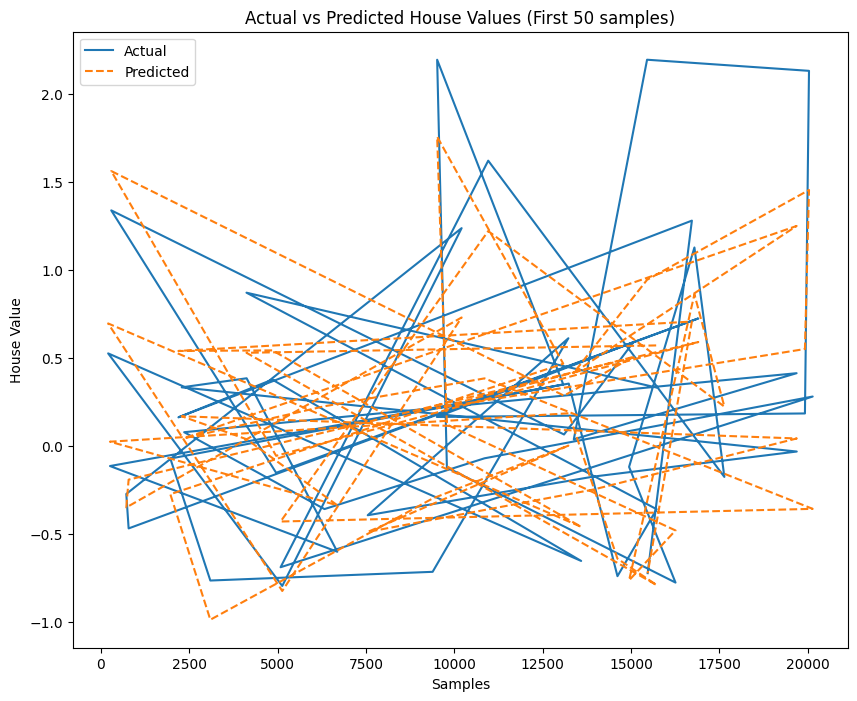

In [51]:
plt.figure(figsize=(10, 8))
plt.plot(test_output[:50]['y_test'], label='Actual')
plt.plot(test_output[:50]['Y_pred'], label='Predicted', linestyle='--')
plt.xlabel('Samples')
plt.ylabel('House Value')
plt.title('Actual vs Predicted House Values (First 50 samples)')
plt.legend()
plt.show()

## `iv` Regularization Mode: On

Let's try $l_1$ and $l_2$ regularization. Use default parameters for simplicity. Does regularization made the model generalize better?

Which of the two regularizations performs better?

In [52]:
sgd_reg_l1 = SGDRegressor(penalty='l1', random_state=42)
sgd_reg_l1.fit(X_housing_train, Y_housing_train)

y_pred_l1 = sgd_reg_l1.predict(X_housing_test)
rmse_l1 = np.sqrt(mean_squared_error(Y_housing_test, y_pred_l1))
print(f"l1 RMSE: {rmse_l1}")

sgd_reg_l2 = SGDRegressor(penalty='l2', random_state=42)
sgd_reg_l2.fit(X_housing_train, Y_housing_train)

y_pred_l2 = sgd_reg_l2.predict(X_housing_test)
rmse_l2 = np.sqrt(mean_squared_error(Y_housing_test, y_pred_l2))
print(f"l2 RMSE: {rmse_l2}")

l1 RMSE: 0.488208395869086
l2 RMSE: 0.4882269886513203


------------------

# `07` Generalization Error

Now that we have tuned our solution, to an *extent*, we need to test for a final time on the held out test set.


Final Model Test Set Evaluation:
RMSE: 0.4882269886513203
MAE: 0.3520912643387706
R^2: 0.6132852890554799


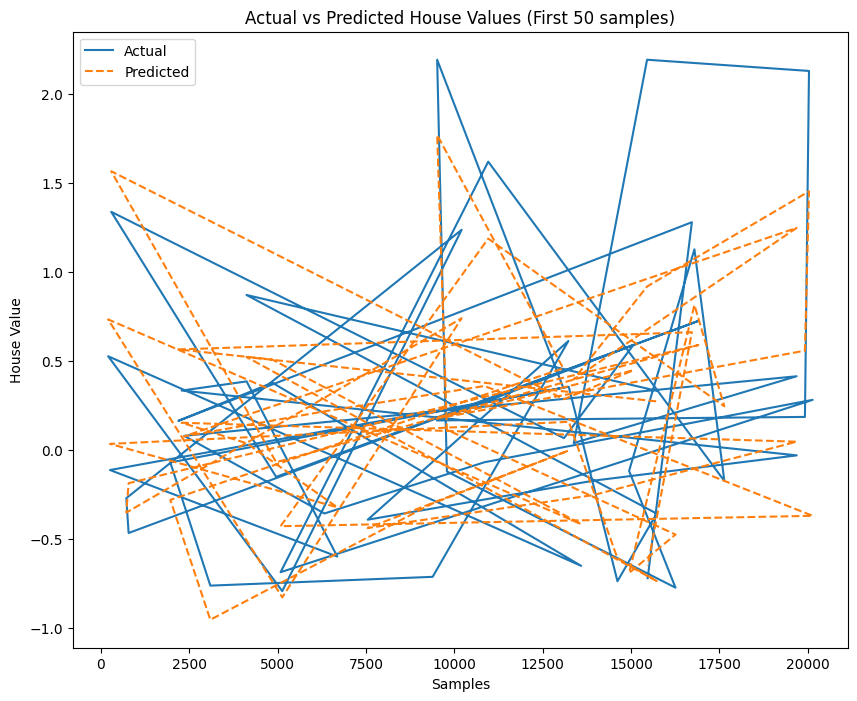

In [54]:
y_pred_test_final = sgd_reg_l2.predict(X_housing_test)

mse_test_final = mean_squared_error(Y_housing_test, y_pred_test_final)
rmse_test_final = mse_test_final**0.5
mae_test_final = mean_absolute_error(Y_housing_test, y_pred_test_final)
r2_test_final = r2_score(Y_housing_test, y_pred_test_final)

print("\nFinal Model Test Set Evaluation:")
print(f"RMSE: {rmse_test_final}")
print(f"MAE: {mae_test_final}")
print(f"R^2: {r2_test_final}")

test_output = pd.DataFrame({'y_test':Y_housing_test,'Y_pred':y_pred_test_final})
plt.figure(figsize=(10, 8))
plt.plot(test_output[:50]['y_test'], label='Actual')
plt.plot(test_output[:50]['Y_pred'], label='Predicted', linestyle='--')
plt.xlabel('Samples')
plt.ylabel('House Value')
plt.title('Actual vs Predicted House Values (First 50 samples)')
plt.legend()
plt.show()


-----------------------------

# `Bonus` Better Flow

For the model to be production-ready, we need to integrate it into a pipeline along with the data preparation flow.

Hint: Look up `sklearn.pipeline.Pipeline` class.


Pipeline Model Test Set Evaluation:
RMSE: 0.4883320185112537
MAE: 0.3524165659557039
R^2: 0.6131188871084665


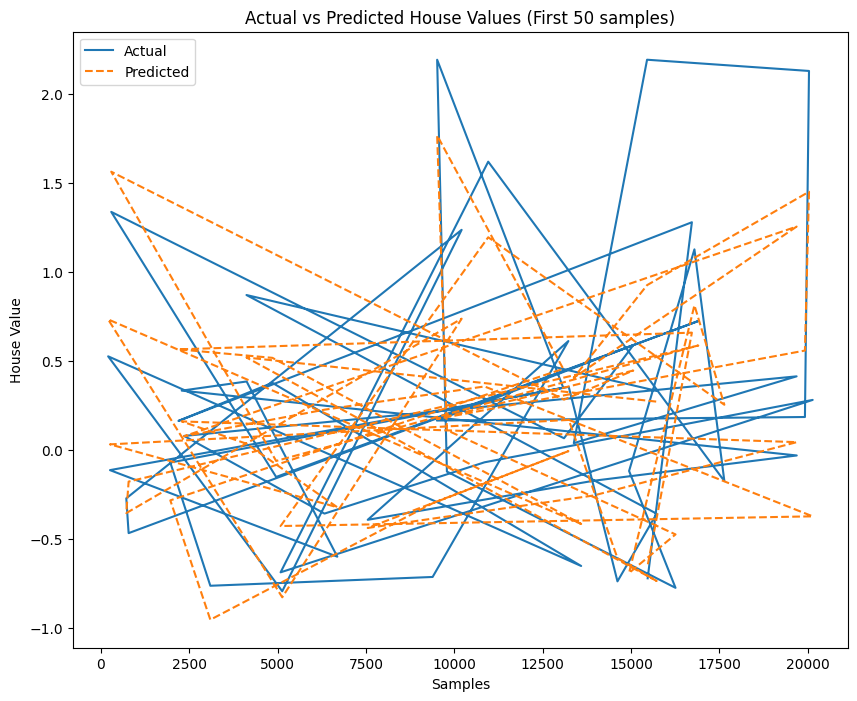

In [55]:
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy="median")),
    ('scaler', RobustScaler()),
    ('model', SGDRegressor(penalty='l2', random_state=42))
])

pipeline.fit(X_housing_train, Y_housing_train)

y_pred_test_pipeline = pipeline.predict(X_housing_test)

mse_test_pipeline = mean_squared_error(Y_housing_test, y_pred_test_pipeline)
rmse_test_pipeline = mse_test_pipeline**0.5
mae_test_pipeline = mean_absolute_error(Y_housing_test, y_pred_test_pipeline)
r2_test_pipeline = r2_score(Y_housing_test, y_pred_test_pipeline)


print("\nPipeline Model Test Set Evaluation:")
print(f"RMSE: {rmse_test_pipeline}")
print(f"MAE: {mae_test_pipeline}")
print(f"R^2: {r2_test_pipeline}")


test_output = pd.DataFrame({'y_test':Y_housing_test,'Y_pred':y_pred_test_pipeline})
plt.figure(figsize=(10, 8))
plt.plot(test_output[:50]['y_test'], label='Actual')
plt.plot(test_output[:50]['Y_pred'], label='Predicted', linestyle='--')
plt.xlabel('Samples')
plt.ylabel('House Value')
plt.title('Actual vs Predicted House Values (First 50 samples)')
plt.legend()
plt.show()


----------------------------------------------

$$ Wish \space you \space all \space the \space best \space ♡ $$
$$ Abdelrahman \space Eid $$